# Your First AI application

Going forward, AI algorithms will be incorporated into more and more everyday applications. For example, you might want to include an image classifier in a smart phone app. To do this, you'd use a deep learning model trained on hundreds of thousands of images as part of the overall application architecture. A large part of software development in the future will be using these types of models as common parts of applications. 

In this project, you'll train an image classifier to recognize different species of flowers. You can imagine using something like this in a phone app that tells you the name of the flower your camera is looking at. In practice you'd train this classifier, then export it for use in your application. We'll be using [this dataset](http://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html) from Oxford of 102 flower categories, you can see a few examples below. 

<img src='assets/Flowers.png' width=500px>

The project is broken down into multiple steps:

* Load the image dataset and create a pipeline.
* Build and Train an image classifier on this dataset.
* Use your trained model to perform inference on flower images.

We'll lead you through each part which you'll implement in Python.

When you've completed this project, you'll have an application that can be trained on any set of labeled images. Here your network will be learning about flowers and end up as a command line application. But, what you do with your new skills depends on your imagination and effort in building a dataset. For example, imagine an app where you take a picture of a car, it tells you what the make and model is, then looks up information about it. Go build your own dataset and make something new.

## Import Resources

In [41]:
%%capture
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub
tfds.disable_progress_bar()

from PIL import Image
from datetime import datetime

from tensorflow.keras import Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
print('Using:')
print('\t\u2022 TensorFlow version:', tf.__version__)
print('\t\u2022 Running on GPU' if tf.test.is_gpu_available() else '\t\u2022 GPU device not found. Running on CPU')

Using:
	• TensorFlow version: 2.14.0
	• Running on GPU


## Load the Dataset

Here you'll use `tensorflow_datasets` to load the [Oxford Flowers 102 dataset](https://www.tensorflow.org/datasets/catalog/oxford_flowers102). This dataset has 3 splits: `'train'`, `'test'`, and `'validation'`.  You'll also need to make sure the training data is normalized and resized to 224x224 pixels as required by the pre-trained networks.

The validation and testing sets are used to measure the model's performance on data it hasn't seen yet, but you'll still need to normalize and resize the images to the appropriate size.

In [3]:
dataset, dataset_info = tfds.load("oxford_flowers102", with_info=True, split=['train', 'validation', 'test'], as_supervised=True)


training_set, validation_set, test_set = dataset

In [4]:
dataset

[<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>]

In [5]:
len(training_set)

1020

In [6]:
len(validation_set)

1020

In [7]:
len(test_set)

6149

## Explore the Dataset

In [8]:
print(f'Training set has {len(training_set)} values')
print(f'Validation set has {len(validation_set)} values')
print(f'Testing set has {len(test_set)} values')


Training set has 1020 values
Validation set has 1020 values
Testing set has 6149 values


In [9]:
# TODO: Get the number of classes in the dataset from the dataset info.
dataset_info

tfds.core.DatasetInfo(
    name='oxford_flowers102',
    full_name='oxford_flowers102/2.1.1',
    description="""
    The Oxford Flowers 102 dataset is a consistent of 102 flower categories commonly
    occurring in the United Kingdom. Each class consists of between 40 and 258
    images. The images have large scale, pose and light variations. In addition,
    there are categories that have large variations within the category and several
    very similar categories.
    
    The dataset is divided into a training set, a validation set and a test set. The
    training set and validation set each consist of 10 images per class (totalling
    1020 images each). The test set consists of the remaining 6149 images (minimum
    20 per class).
    
    Note: The dataset by default comes with a test size larger than the train size.
    For more info see this
    [issue](https://github.com/tensorflow/datasets/issues/3022).
    """,
    homepage='https://www.robots.ox.ac.uk/~vgg/data/flowers/102

In [10]:
training_set

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

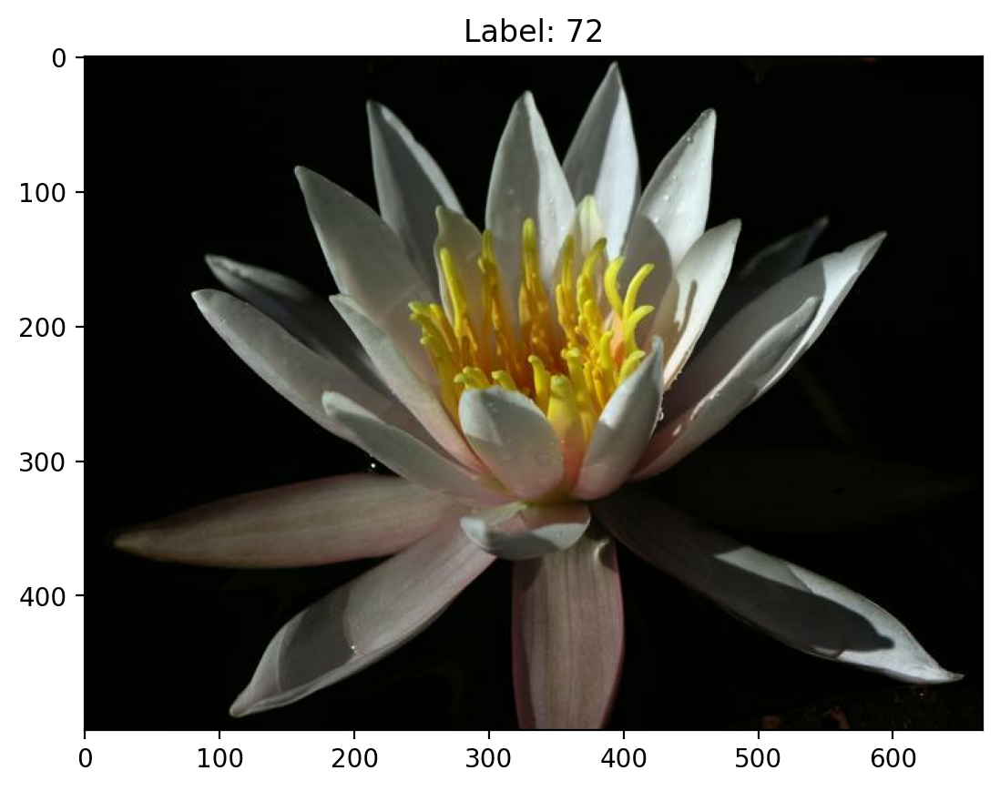

In [11]:
for image, label in training_set.take(1):
    image = image.numpy()
    label = label.numpy()
    
plt.imshow(image)
plt.title(f"Label: {label}")
plt.show()

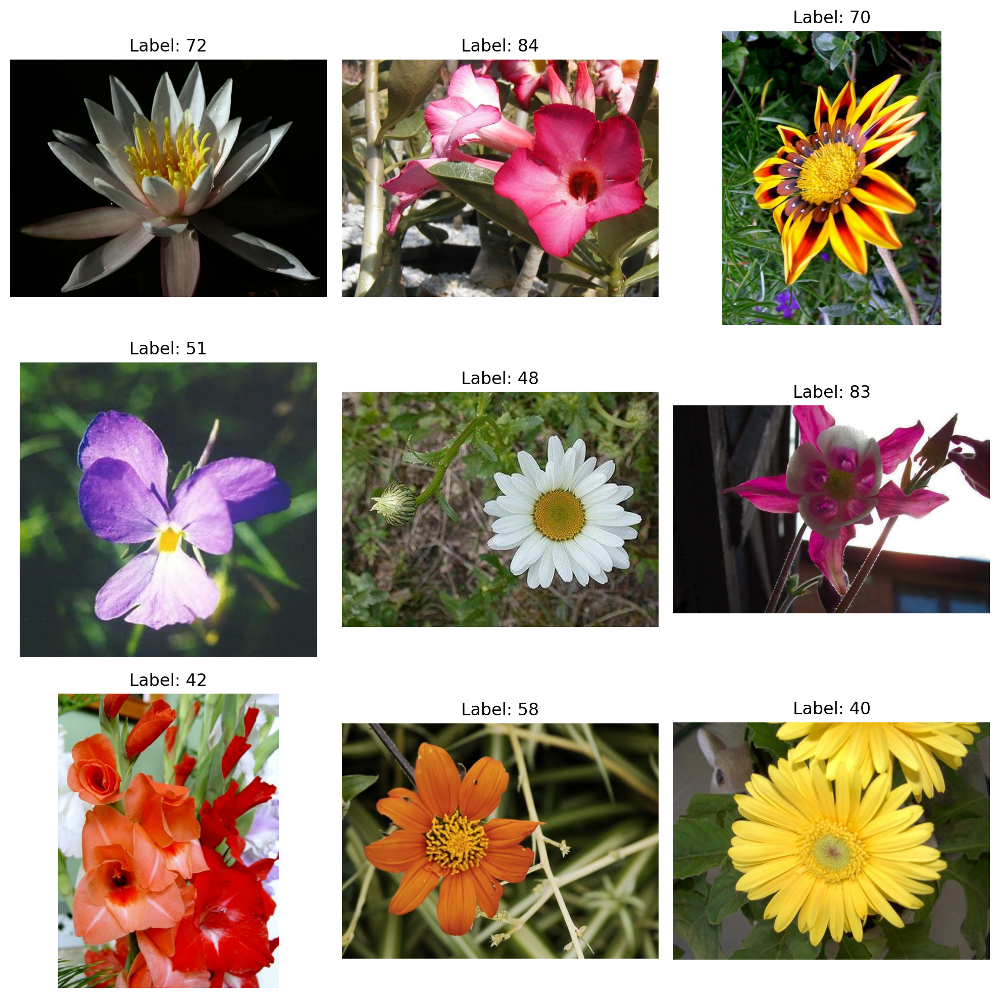

In [12]:
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i, (image, label) in enumerate(training_set.take(9)):
    image = image.numpy()
    label = label.numpy()
    
    row, col = divmod(i, 3)
    ax = axes[row, col]
    
    ax.imshow(image)
    ax.set_title(f"Label: {label}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### Label Mapping

You'll also need to load in a mapping from label to category name. You can find this in the file `label_map.json`. It's a JSON object which you can read in with the [`json` module](https://docs.python.org/3.7/library/json.html). This will give you a dictionary mapping the integer coded labels to the actual names of the flowers.

In [13]:
with open('label_map.json', 'r') as f:
    class_names = json.load(f)

In [14]:
print(class_names)

{'0': 'pink primrose', '1': 'hard-leaved pocket orchid', '2': 'canterbury bells', '3': 'sweet pea', '4': 'english marigold', '5': 'tiger lily', '6': 'moon orchid', '7': 'bird of paradise', '8': 'monkshood', '9': 'globe thistle', '10': 'snapdragon', '11': "colt's foot", '12': 'king protea', '13': 'spear thistle', '14': 'yellow iris', '15': 'globe-flower', '16': 'purple coneflower', '17': 'peruvian lily', '18': 'balloon flower', '19': 'giant white arum lily', '20': 'fire lily', '21': 'pincushion flower', '22': 'fritillary', '23': 'red ginger', '24': 'grape hyacinth', '25': 'corn poppy', '26': 'prince of wales feathers', '27': 'stemless gentian', '28': 'artichoke', '29': 'sweet william', '30': 'carnation', '31': 'garden phlox', '32': 'love in the mist', '33': 'mexican aster', '34': 'alpine sea holly', '35': 'ruby-lipped cattleya', '36': 'cape flower', '37': 'great masterwort', '38': 'siam tulip', '39': 'lenten rose', '40': 'barbeton daisy', '41': 'daffodil', '42': 'sword lily', '43': 'poi

In [15]:
type(training_set)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

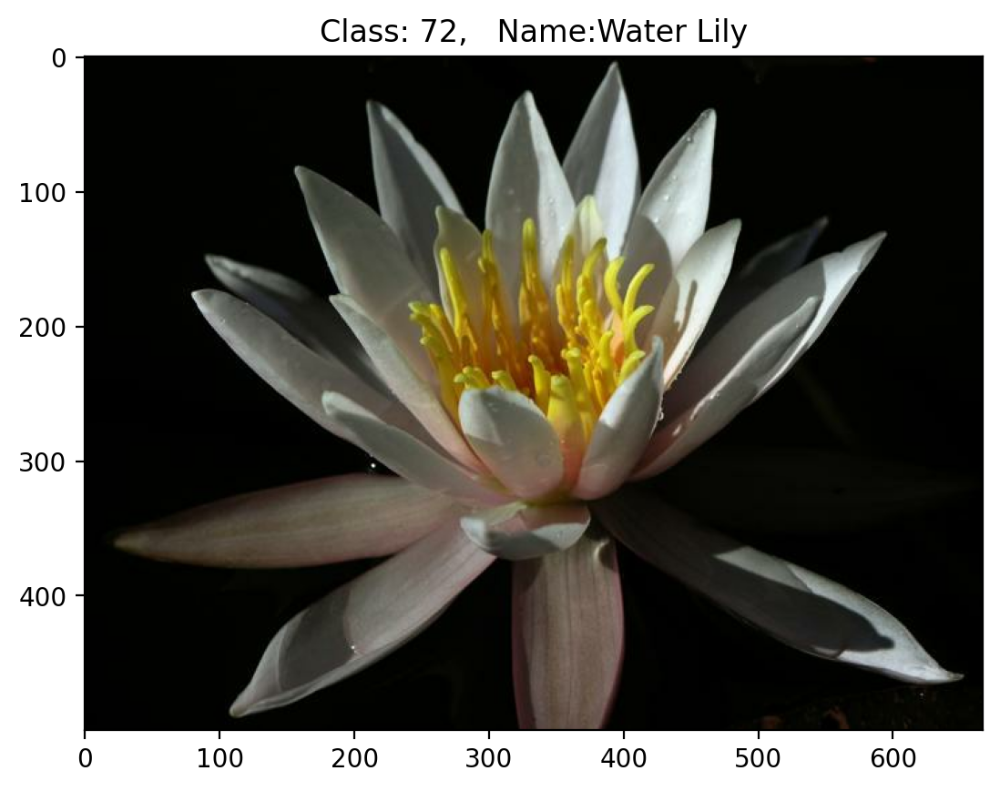

In [16]:
for image, label in training_set.take(1):
    image = image.numpy()
    label = label.numpy()

plt.title('Class: ' + str(label) + ",   Name:" + class_names[str(label)].title())
plt.imshow(image);

## Create Pipeline

cache, shuffle, batch, map, prefetch

In [17]:
batch_size = 64
image_size = 224


num_training_examples = len(training_set)
shuffle_size = num_training_examples // 4

def normalize(image, label):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (image_size, image_size))
    image /= 255
    return image, label

training_batches = training_set.cache().shuffle(num_training_examples//4).map(normalize).batch(batch_size).prefetch(1)
validation_batches = validation_set.cache().map(normalize).batch(batch_size).prefetch(1)
testing_batches = test_set.cache().map(normalize).batch(batch_size).prefetch(1)

# Build and Train the Classifier

Now that the data is ready, it's time to build and train the classifier. You should use the MobileNet pre-trained model from TensorFlow Hub to get the image features. Build and train a new feed-forward classifier using those features.

We're going to leave this part up to you. If you want to talk through it with someone, chat with your fellow students! 

Refer to the rubric for guidance on successfully completing this section. Things you'll need to do:

* Load the MobileNet pre-trained network from TensorFlow Hub.
* Define a new, untrained feed-forward network as a classifier.
* Train the classifier.
* Plot the loss and accuracy values achieved during training for the training and validation set.
* Save your trained model as a Keras model. 

We've left a cell open for you below, but use as many as you need. Our advice is to break the problem up into smaller parts you can run separately. Check that each part is doing what you expect, then move on to the next. You'll likely find that as you work through each part, you'll need to go back and modify your previous code. This is totally normal!

When training make sure you're updating only the weights of the feed-forward network. You should be able to get the validation accuracy above 70% if you build everything right.

**Note for Workspace users:** One important tip if you're using the workspace to run your code: To avoid having your workspace disconnect during the long-running tasks in this notebook, please read in the earlier page in this lesson called Intro to GPU Workspaces about Keeping Your Session Active. You'll want to include code from the workspace_utils.py module. Also, If your model is over 1 GB when saved as a checkpoint, there might be issues with saving backups in your workspace. If your saved checkpoint is larger than 1 GB (you can open a terminal and check with `ls -lh`), you should reduce the size of your hidden layers and train again.

In [18]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

### Using a MobileNet without its final layer

In [19]:
URL = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

#matching MobileNet's training data shape
feature_extractor = hub.KerasLayer(URL, input_shape=(image_size, image_size, 3))  

In [20]:
#freezing weights and biases of previous layers;

feature_extractor.trainable = False

In [21]:
tf.keras.backend.clear_session()

### Model Architecture

In [22]:
model = tf.keras.Sequential([
        Input(shape=(224, 224, 3)),
        data_augmentation,
        feature_extractor,
        tf.keras.layers.Dropout(0.35), 
        tf.keras.layers.Dense(102, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 102)               130662    
                                                                 
Total params: 2388646 (9.11 MB)
Trainable params: 130662 (510.40 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [23]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

EPOCHS = 10

# Define EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

# Train the model with the EarlyStopping callback
history = model.fit(training_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[early_stopping]  # Pass the callback object inside a list
                   )

Epoch 1/10
16/16 [==============================] - 21s 712ms/step - loss: 4.9530 - accuracy: 0.0245 - val_loss: 3.9078 - val_accuracy: 0.1373
Epoch 2/10
16/16 [==============================] - 6s 376ms/step - loss: 3.6428 - accuracy: 0.1657 - val_loss: 3.0721 - val_accuracy: 0.3971
Epoch 3/10
16/16 [==============================] - 6s 383ms/step - loss: 2.7681 - accuracy: 0.3931 - val_loss: 2.4797 - val_accuracy: 0.5647
Epoch 4/10
16/16 [==============================] - 6s 370ms/step - loss: 2.1697 - accuracy: 0.5529 - val_loss: 2.0809 - val_accuracy: 0.6255
Epoch 5/10
16/16 [==============================] - 6s 379ms/step - loss: 1.7674 - accuracy: 0.6500 - val_loss: 1.8105 - val_accuracy: 0.6765
Epoch 6/10
16/16 [==============================] - 6s 392ms/step - loss: 1.4699 - accuracy: 0.7020 - val_loss: 1.6126 - val_accuracy: 0.7069
Epoch 7/10
16/16 [==============================] - 6s 375ms/step - loss: 1.2164 - accuracy: 0.7647 - val_loss: 1.4794 - val_accuracy: 0.7196
Epoch

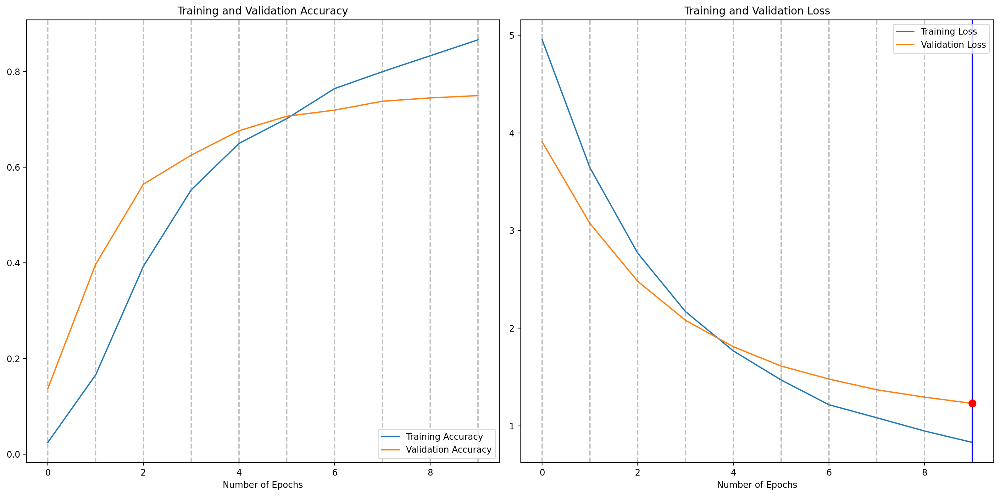

In [24]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

training_loss = history.history['loss']
validation_loss = history.history['val_loss']

epochs_range = range(len(training_accuracy))

plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, training_accuracy, label='Training Accuracy')
plt.plot(epochs_range, validation_accuracy, label='Validation Accuracy')

for epoch in epochs_range:
    plt.axvline(x=epoch, color='gray', linestyle='--', alpha=0.5)

plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Number of Epochs')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, training_loss, label='Training Loss')
plt.plot(epochs_range, validation_loss, label='Validation Loss')

for epoch in epochs_range:
    plt.axvline(x=epoch, color='gray', linestyle='--', alpha=0.5)

min_loss = np.min(validation_loss)
min_epoch = np.argmin(validation_loss)

plt.axvline(x=min_epoch, color='b', linestyle='-', linewidth=1.5, alpha=1)

plt.plot(min_epoch, min_loss, 'ro', markersize=8)

plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Number of Epochs')

plt.tight_layout()# Adjusts subplots to fit into the figure area
plt.show()

### Here, we see just about `13` Epochs are just about perfect for our Augmented Dataset. 

## Testing your Network

It's good practice to test your trained network on test data, images the network has never seen either in training or validation. This will give you a good estimate for the model's performance on completely new images. You should be able to reach around 70% accuracy on the test set if the model has been trained well.

In [50]:
loss, accuracy = model.evaluate(testing_batches)

print('\nLoss on the TEST Set: {:,.3f}'.format(loss))
print('Accuracy on the TEST Set: {:.3%}'.format(accuracy))

 1/97 [..............................] - ETA: 34s - loss: 1.3337 - accuracy: 0.7188

97/97 [==============================] - 0s 901us/step - loss: 1.3380 - accuracy: 0.7000

Loss on the TEST Set: 1.338
Accuracy on the TEST Set: 70.000%


2/2 [==============================] - 1s 14ms/step


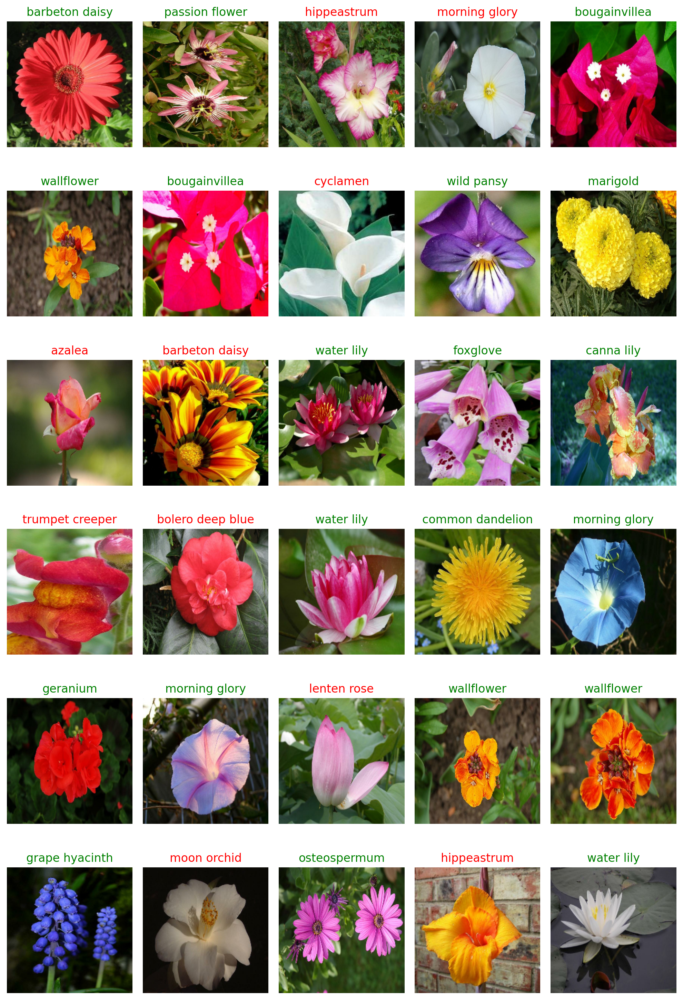

In [25]:
# Take 1 batch from the testing set
for image_batch, label_batch in testing_batches.take(1):
    ps = model.predict(image_batch)
    
    # Converting tensors to NumPy arrays
    images = image_batch.numpy().squeeze()
    labels = label_batch.numpy()

# Set up the figure for displaying images
plt.figure(figsize=(10, 15))

# Loop through the first 30 in the batch
for n in range(30):
    plt.subplot(6, 5, n + 1)  # Create a grid of 6 rows and 5 columns
    plt.imshow(images[n], cmap=plt.cm.binary)  # to Display the image in grayscale
    
    # Get the predicted class index and convert it to a string for dictionary lookup
    predicted_class_index = str(np.argmax(ps[n]))
    
    # Determine if the prediction is correct and set title color accordingly
    color = 'green' if int(predicted_class_index) == labels[n] else 'red'
    
    # Display the predicted class name as the title
    plt.title(class_names[predicted_class_index], color=color)
    plt.axis('off')  # Remove axes for cleaner visualization

# Show all subplots
plt.tight_layout()
plt.show()

## Save the Model

Now that your network is trained, save the model so you can load it later for making inference. In the cell below save your model as a Keras model (*i.e.* save it as an HDF5 file).

In [47]:
base_filename = 'final_model'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

In [48]:
saved_model_filepath = f'{base_filename}_{timestamp}.h5'

In [49]:
model.save(saved_model_filepath)
print(f'Model saved to {saved_model_filepath}')

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved to final_model_20241130_080507.h5


## Load the Keras Model

Load the Keras model you saved above.

In [29]:
#Loading in the model 

reloaded_model = tf.keras.models.load_model(
       (saved_model_filepath),
       custom_objects={'KerasLayer':hub.KerasLayer}
)

In [30]:
try:
    np.testing.assert_allclose(
            model.predict(testing_batches), reloaded_model.predict(testing_batches)
    )
    print('\n\nYup, same model :)')
except AssertionError:
    print('Totally different models')

 2/97 [..............................] - ETA: 1:07

 2/97 [..............................] - ETA: 8s  

97/97 [==============================] - 1s 1ms/step


Yup, same model :)


# Inference for Classification

Now you'll write a function that uses your trained network for inference. Write a function called `predict` that takes an image, a model, and then returns the top $K$ most likely class labels along with the probabilities. The function call should look like: 

```python
probs, classes = predict(image_path, model, top_k)
```

If `top_k=5` the output of the `predict` function should be something like this:

```python
probs, classes = predict(image_path, model, 5)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

Your `predict` function should use `PIL` to load the image from the given `image_path`. You can use the [Image.open](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.open) function to load the images. The `Image.open()` function returns an `Image` object. You can convert this `Image` object to a NumPy array by using the `np.asarray()` function.

The `predict` function will also need to handle pre-processing the input image such that it can be used by your model. We recommend you write a separate function called `process_image` that performs the pre-processing. You can then call the `process_image` function from the `predict` function. 

### Image Pre-processing

The `process_image` function should take in an image (in the form of a NumPy array) and return an image in the form of a NumPy array with shape `(224, 224, 3)`.

First, you should convert your image into a TensorFlow Tensor and then resize it to the appropriate size using `tf.image.resize`.

Second, the pixel values of the input images are typically encoded as integers in the range 0-255, but the model expects the pixel values to be floats in the range 0-1. Therefore, you'll also need to normalize the pixel values. 

Finally, convert your image back to a NumPy array using the `.numpy()` method.

In [31]:
def process_image(image):
    image = tf.convert_to_tensor(image)
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (image_size, image_size))
    image /= 255
    return image.numpy()

To check your `process_image` function we have provided 4 images in the `./test_images/` folder:

* cautleya_spicata.jpg
* hard-leaved_pocket_orchid.jpg
* orange_dahlia.jpg
* wild_pansy.jpg

The code below loads one of the above images using `PIL` and plots the original image alongside the image produced by your `process_image` function. If your `process_image` function works, the plotted image should be the correct size. 

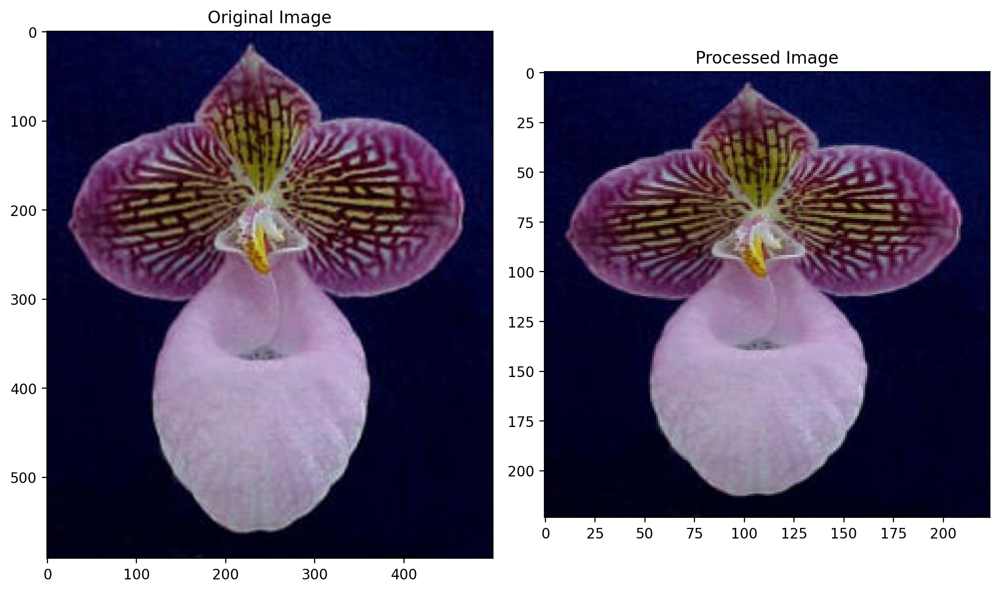

In [32]:
from PIL import Image

image_path = './test_images/hard-leaved_pocket_orchid.jpg'
im = Image.open(image_path)
test_image = np.asarray(im)

processed_test_image = process_image(test_image)

fig, (ax1, ax2) = plt.subplots(figsize=(10,10), ncols=2)
ax1.imshow(test_image)
ax1.set_title('Original Image')
ax2.imshow(processed_test_image)
ax2.set_title('Processed Image')
plt.tight_layout()
plt.show()

Once you can get images in the correct format, it's time to write the `predict` function for making inference with your model.

### Inference

Remember, the `predict` function should take an image, a model, and then returns the top $K$ most likely class labels along with the probabilities. The function call should look like: 

```python
probs, classes = predict(image_path, model, top_k)
```

If `top_k=5` the output of the `predict` function should be something like this:

```python
probs, classes = predict(image_path, model, 5)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

Your `predict` function should use `PIL` to load the image from the given `image_path`. You can use the [Image.open](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.open) function to load the images. The `Image.open()` function returns an `Image` object. You can convert this `Image` object to a NumPy array by using the `np.asarray()` function.

**Note:** The image returned by the `process_image` function is a NumPy array with shape `(224, 224, 3)` but the model expects the input images to be of shape `(1, 224, 224, 3)`. This extra dimension represents the batch size. We suggest you use the `np.expand_dims()` function to add the extra dimension. 

### Using the top-k method as in [here](https://stackoverflow.com/questions/50640687/get-top-k-predictions-from-tensorflow)

In [33]:
def predict(image_path, model, top_k):
    image = Image.open(image_path)
    image = np.asarray(image)
    image = process_image(image)
    _image = np.expand_dims(image, axis = 0)
    predictions =  model.predict(_image)
    top_k_values, top_k_indices = tf.nn.top_k(predictions, k= top_k)
    return top_k_values.numpy(), top_k_indices.numpy(), image

# Sanity Check

It's always good to check the predictions made by your model to make sure they are correct. To check your predictions we have provided 4 images in the `./test_images/` folder:

* cautleya_spicata.jpg
* hard-leaved_pocket_orchid.jpg
* orange_dahlia.jpg
* wild_pansy.jpg

In the cell below use `matplotlib` to plot the input image alongside the probabilities for the top 5 classes predicted by your model. Plot the probabilities as a bar graph. The plot should look like this:

<img src='assets/inference_example.png' width=600px>

You can convert from the class integer labels to actual flower names using `class_names`. 

1/1 [==============================] - 0s 31ms/step


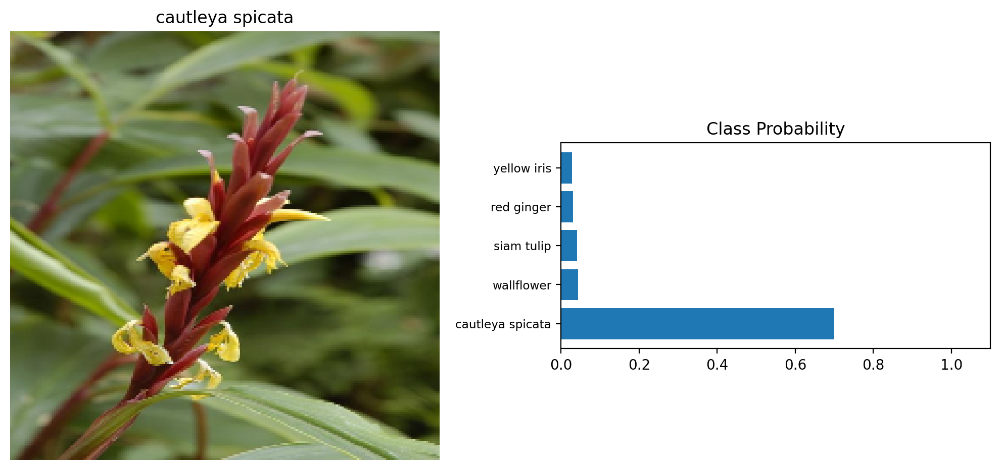

1/1 [==============================] - 0s 30ms/step


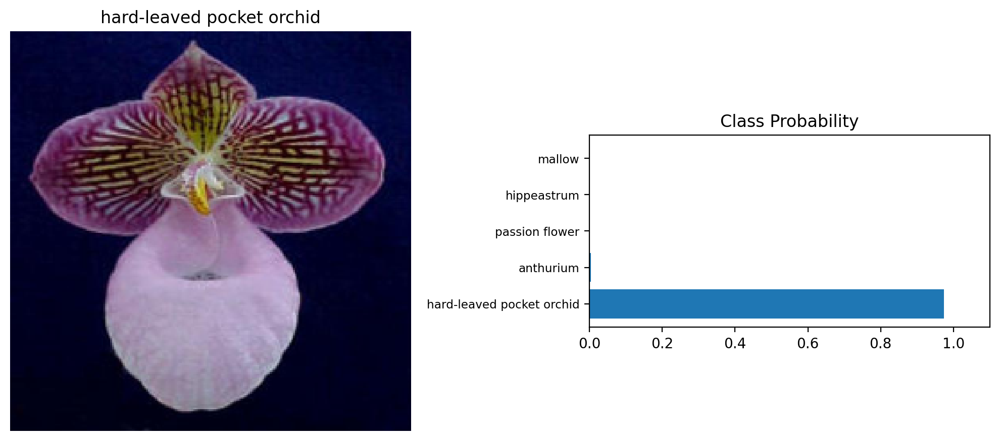

1/1 [==============================] - 0s 41ms/step


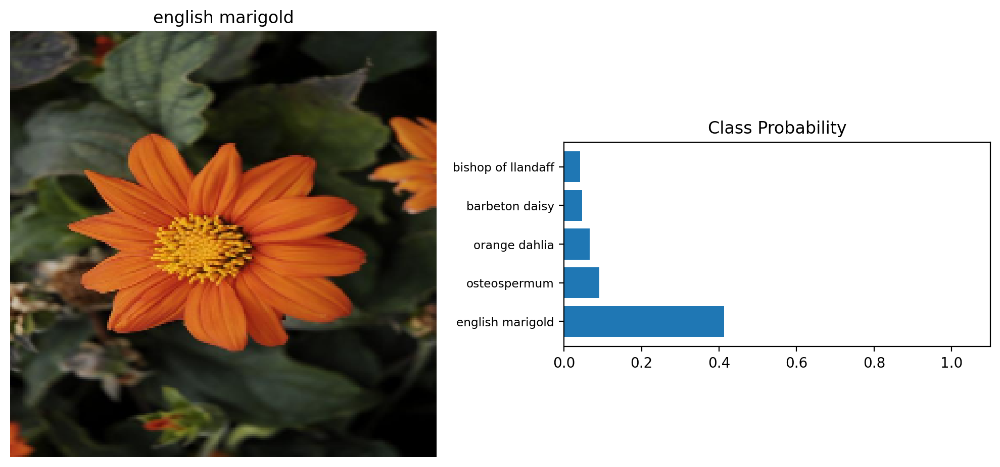

1/1 [==============================] - 0s 31ms/step


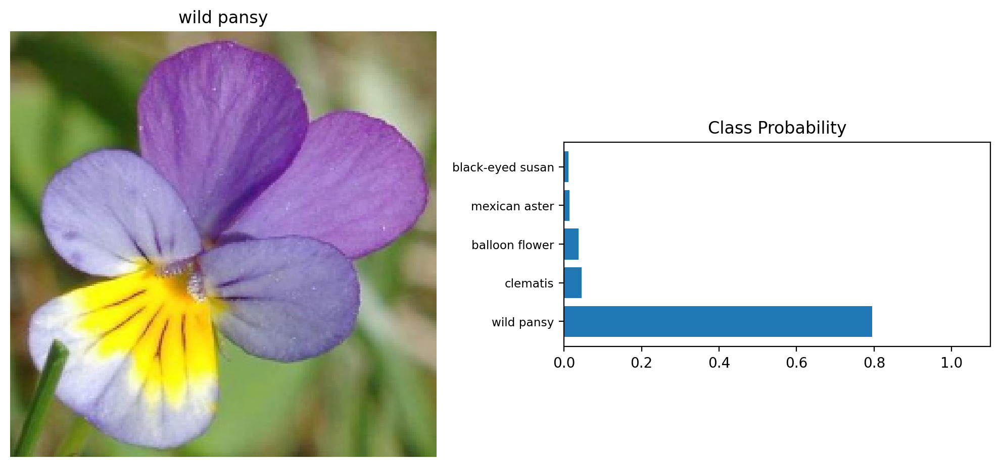

In [37]:
images = ['cautleya_spicata.jpg', 'hard-leaved_pocket_orchid.jpg', 'orange_dahlia.jpg', 'wild_pansy.jpg']
for image in images:
    top_k = 5
    try:
        image_path = './test_images/{}'.format(image)
        probs, classes, image = predict(image_path, model, top_k)
    except IOError:
        pass
    
    names = []
    for i in classes[0]:
        names.append(class_names[str(i)])

    fig, (ax1, ax2) = plt.subplots(figsize=(10,10), ncols=2)
    ax1.imshow(image)
    ax1.axis('off')
    ax1.set_title(names[0])
    
    ax2.barh(np.arange(5), probs[0])
    ax2.set_yticks(np.arange(5))
    ax2.set_yticklabels(names, size='small')
    ax2.set_aspect(0.1)
    ax2.set_xlim(0, 1.1)
    ax2.set_title('Class Probability')
    plt.tight_layout()
    
    plt.show()


In [40]:
print('Sanity checks all passed! ')

Sanity checks all passed! 


![Description of GIF](https://i.giphy.com/media/v1.Y2lkPTc5MGI3NjExbmY5azNqdjM2c3BxbnFodGZ2YmhmaDZsYW8xbXA2bDZyam1keDRlcSZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/3Le0yU6iJvZXrNfvry/giphy.gif)